<a href="https://githubtocolab.com/tannialhernandez/topicosAvanzadosAnalitica/blob/main/E1-DataDrift/E1-UsedVehiclePricePredictionDrift.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# E1 - Data Drift in Used Vehicle Price Prediction

## Introduction

- 1.2 Million listings scraped from TrueCar.com - Price, Mileage, Make, Model dataset from Kaggle: [data](https://www.kaggle.com/jpayne/852k-used-car-listings)
- Each observation represents the price of an used car

### Dependencies 

In [1]:
import sys
import subprocess
import importlib.util

required_packages = {
    'pandas': '==2.2.3',
    'numpy': '==1.24.4',
    'seaborn': '==0.13.2',
    'ydata-profiling': '==4.13.0',
    'scikit-learn': '==1.6.1',
    'xgboost': '==2.1.4',
    'matplotlib': '==3.10.0',
    'joblib': '==1.4.2',
    'evidently': '==0.6.5',
    'dash': '==2.18.2',
    'dash-bootstrap-components': '==1.7.1',
    'ipython': '==8.31.0'
}

for package in required_packages:
    import_name = package.replace('-', '_')
    if importlib.util.find_spec(import_name) is None:
        print(f"Instalando {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package])
    else:
        print(f"{package} ya está instalado")

pandas ya está instalado
numpy ya está instalado
seaborn ya está instalado
ydata-profiling ya está instalado
Instalando scikit-learn...
xgboost ya está instalado
matplotlib ya está instalado
joblib ya está instalado
evidently ya está instalado
dash ya está instalado
dash-bootstrap-components ya está instalado
Instalando ipython...


In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.preprocessing import OneHotEncoder, StandardScaler,OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import KFold, GridSearchCV,ParameterGrid, train_test_split
import xgboost as XGBRegressor
import time
import joblib
from sklearn.base import clone
import pickle
import os
from evidently import ColumnMapping
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset
from evidently.metric_preset import DataQualityPreset
from evidently.metric_preset import TargetDriftPreset, RegressionPreset
import dash
from dash import html, dcc
import dash_bootstrap_components as dbc
from dash.dependencies import Input, Output, State



In [3]:
os.makedirs('./Models/', exist_ok=True)
os.makedirs('./Imagenes/', exist_ok=True)

In [4]:
data = pd.read_csv('https://github.com/sergiomora03/AdvancedTopicsAnalytics/raw/main/datasets/dataTrain_carListings.zip')

In [5]:
data.head()

,Price,Year,Mileage,State,Make,Model
0,21490,2014,31909,MD,Nissan,MuranoAWD
1,21250,2016,25741,KY,Chevrolet,CamaroCoupe
2,20925,2016,24633,SC,Hyundai,Santa
3,14500,2012,84026,OK,Jeep,Grand
4,32488,2013,22816,TN,Jeep,Wrangler


In [6]:
data.shape

(500000, 6)

In [7]:
data.columns

Index(['Price', 'Year', 'Mileage', 'State', 'Make', 'Model'], dtype='object')

# Exercise P0.1 (20%)

Complete an exploratory data analysis with the variables in the dataset to determine the relationships between the vehicle price (target feature) and the other features. Remember to separate the analysis between bivariate and multivariate, in order to see the effects of each feature separately and then with a set of features.

In [8]:
data.Price.describe()

count    500000.000000
mean      21144.186304
std       10753.259704
min        5001.000000
25%       13499.000000
50%       18450.000000
75%       26998.000000
max       79999.000000
Name: Price, dtype: float64

<Axes: xlabel='Year', ylabel='Price'>

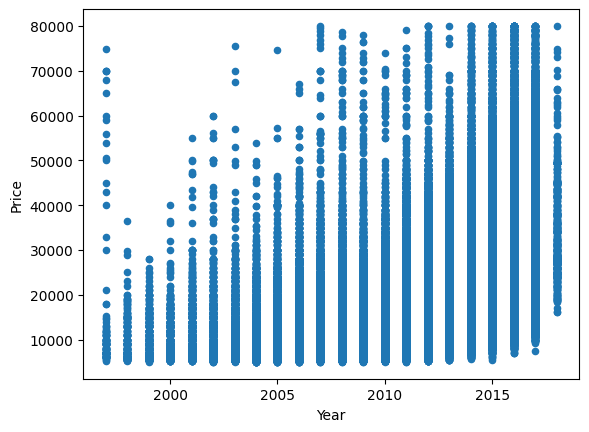

In [9]:
data.plot(kind='scatter', y='Price', x='Year')

<Axes: xlabel='Mileage', ylabel='Price'>

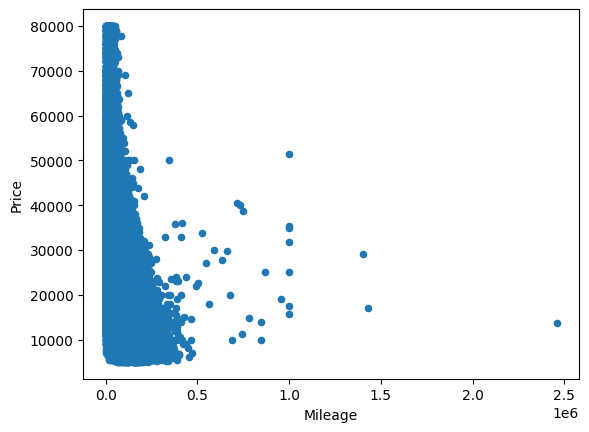

In [10]:
data.plot(kind='scatter', y='Price', x='Mileage')

We are going to use ydata-profiling (formerly pandas-profiling), a Python library that helps us quickly explore and analyze our dataset. This tool automatically generates a comprehensive report with insights about each variable, correlations, missing values, and potential issues in the data. By leveraging this, we can efficiently perform exploratory data analysis (EDA)

In [11]:
profile = ProfileReport(pd.concat([data], axis=1), title="Data Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 6/6 [00:00<00:00,  8.47it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Alert Exploratory Data Analysis

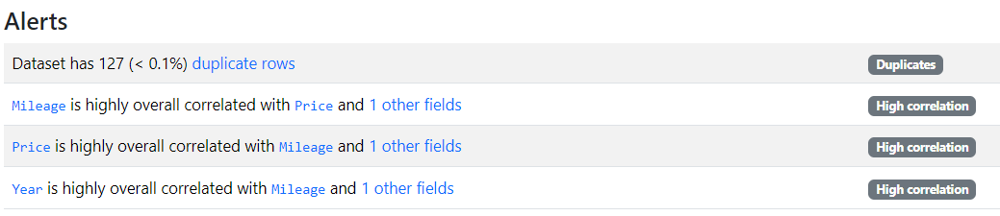
* There are 127 rows in the dataset that are exact copies of others. While this represents less than 0.1% of the total data, duplicates indicate redundancy in the dataset.
* Mileage, which represents the total distance a vehicle has traveled, shows a strong correlation with Price. As mileage increases or decreases, the price follows a predictable trend. The correlation with another feature suggests that Mileage is closely related to multiple aspects of the dataset.
* Price, the target variable, has a strong correlation with Mileage, confirming that vehicles with higher mileage tend to have lower prices. Another feature also shows a strong relationship with price, indicating that multiple factors influence vehicle pricing.
* Manufacturing Year has a strong relationship with Mileage, which aligns with the expectation that older vehicles generally have higher mileage. Another feature is also correlated with Year, suggesting that this variable is interconnected with multiple characteristics in the dataset.

# Conclusion Exploratory Data Analysis

* Mileage and Price have a strong negative correlation (-0.543), confirming that vehicles with higher mileage tend to have lower prices.
* Year and Mileage are highly negatively correlated (-0.786), meaning older cars generally have more mileage.
* Year and Price show a positive correlation (0.537), indicating that newer cars are usually more expensive.
* Make (brand) has a weak correlation with numerical variables, suggesting that price is influenced more by factors like mileage and year rather than just the brand.
* The dataset contains a high number of distinct values for Price (38,222) and Mileage (139,548), reflecting significant variability in vehicle listings.
* State, Make, and Model have low distinct percentages, meaning they have limited unique categories compared to the total dataset size.


## Exercise P0.2 (20%)




Develop a machine learning model that predicts the price of the of car using as an input ['Year', 'Mileage', 'State', 'Make', 'Model'] **train model with data until 2010**.

*Evaluation:*

* 10% - Performance of the models using a manually implemented K-Fold (K=10) cross-validation
* 10% - Notebook explaining the process for selecting the best model. You must specify how the calibration of each of the parameters is done and how these change the performance of the model. It is expected that a clear comparison will be made of all implemented models.. Present the most relevant conslusions about the whole process.

In [12]:
data = data.drop_duplicates()

data_2010 = data[data['Year'] <= 2010]
data_Mayor_2010 = data[data['Year'] > 2010]

features = ['Year', 'Mileage', 'State', 'Make', 'Model']
X = data_2010[features]
y = data_2010['Price']

numeric_features = ['Year', 'Mileage']
numeric_transformer = StandardScaler()

categorical_features = ['State', 'Make', 'Model']
categorical_transformer = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

X_transformed = preprocessor.fit_transform(X)

feature_names = (
    numeric_features +
    preprocessor.transformers_[1][1].get_feature_names_out().tolist()
)

preprocessor.fit(X)


ColumnTransformer(transformers=[('num', StandardScaler(), ['Year', 'Mileage']),
                                ('cat',
                                 OrdinalEncoder(handle_unknown='use_encoded_value',
                                                unknown_value=-1),
                                 ['State', 'Make', 'Model'])])

In [13]:
#Drift df
X_transformed_df = pd.DataFrame(X_transformed, columns=feature_names)
X_Mayor_2010 = data_Mayor_2010[features]
X_Mayor_2010_transformed = preprocessor.transform(X_Mayor_2010)
X_Mayor_2010_transformed_df = pd.DataFrame(X_Mayor_2010_transformed, columns=feature_names)

Starting 10-fold cross-validation for LinearRegression...
  Fold 1/10 - RMSE: 5631.29, MAE: 4029.67, R²: 0.1496, Time: 0.03s
  Fold 2/10 - RMSE: 5403.35, MAE: 3977.43, R²: 0.1746, Time: 0.04s
  Fold 3/10 - RMSE: 5749.08, MAE: 4095.23, R²: 0.1620, Time: 0.04s
  Fold 4/10 - RMSE: 5764.85, MAE: 4085.73, R²: 0.1520, Time: 0.04s
  Fold 5/10 - RMSE: 5540.54, MAE: 4011.70, R²: 0.1569, Time: 0.03s
  Fold 6/10 - RMSE: 5660.48, MAE: 4049.01, R²: 0.1683, Time: 0.04s
  Fold 7/10 - RMSE: 5724.95, MAE: 4067.60, R²: 0.1549, Time: 0.04s
  Fold 8/10 - RMSE: 5979.03, MAE: 4143.54, R²: 0.1460, Time: 0.03s
  Fold 9/10 - RMSE: 5902.09, MAE: 4128.21, R²: 0.1500, Time: 0.04s
  Fold 10/10 - RMSE: 5809.75, MAE: 4066.79, R²: 0.1591, Time: 0.04s
Average - RMSE: 5716.54, MAE: 4065.49, R²: 0.1573, Time: 0.04s
Starting 10-fold cross-validation for Ridge...
  Fold 1/10 - RMSE: 5631.29, MAE: 4029.67, R²: 0.1496, Time: 0.03s
  Fold 2/10 - RMSE: 5403.35, MAE: 3977.43, R²: 0.1746, Time: 0.03s
  Fold 3/10 - RMSE: 5749.08

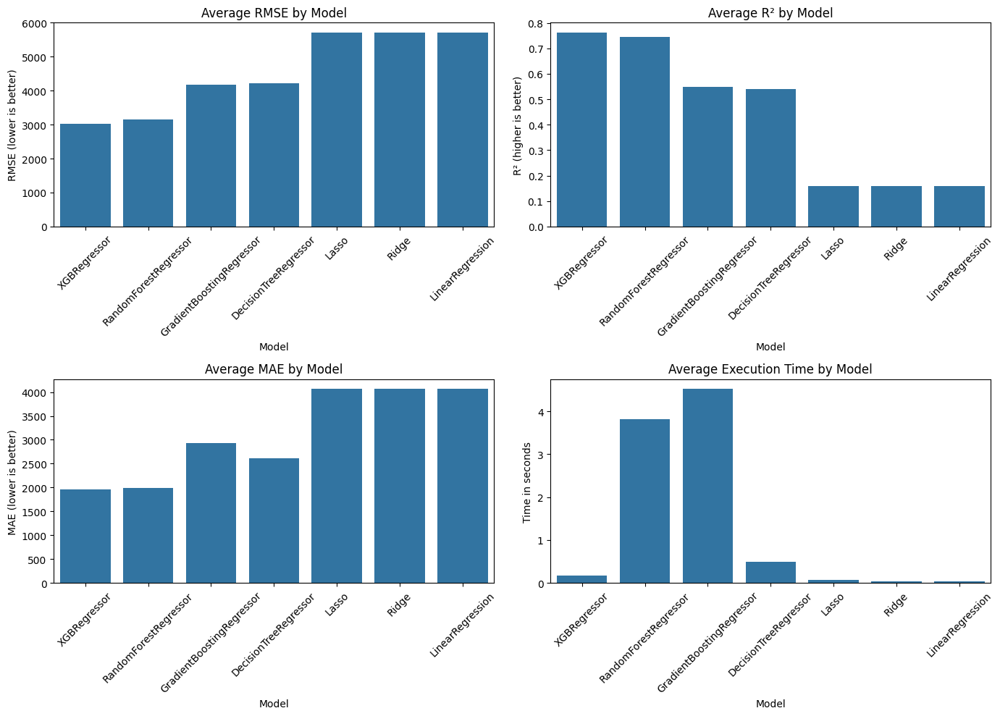

In [14]:
def manual_kfold_cv(X, y, model, k=10, random_state=42):
    kf = KFold(n_splits=k, shuffle=True, random_state=random_state)
    
    rmse_scores = []
    mae_scores = []
    r2_scores = []
    fold_times = []
    
    print(f"Starting {k}-fold cross-validation for {model.__class__.__name__}...")
    
    for fold, (train_idx, test_idx) in enumerate(kf.split(X, y), 1):
        start_time = time.time()
        
        X_train_fold, X_test_fold = X.iloc[train_idx], X.iloc[test_idx]
        y_train_fold, y_test_fold = y.iloc[train_idx], y.iloc[test_idx]
    
        X_train_transformed = preprocessor.transform(X_train_fold)
        X_test_transformed = preprocessor.transform(X_test_fold)
        
        model.fit(X_train_transformed, y_train_fold)
        
        y_pred = model.predict(X_test_transformed)
        rmse = np.sqrt(mean_squared_error(y_test_fold, y_pred))
        mae = mean_absolute_error(y_test_fold, y_pred)
        r2 = r2_score(y_test_fold, y_pred)
        
        rmse_scores.append(rmse)
        mae_scores.append(mae)
        r2_scores.append(r2)
        
        fold_time = time.time() - start_time
        fold_times.append(fold_time)
        
        print(f"  Fold {fold}/{k} - RMSE: {rmse:.2f}, MAE: {mae:.2f}, R²: {r2:.4f}, Time: {fold_time:.2f}s")
    
    avg_rmse = np.mean(rmse_scores)
    avg_mae = np.mean(mae_scores)
    avg_r2 = np.mean(r2_scores)
    avg_time = np.mean(fold_times)
    
    print(f"Average - RMSE: {avg_rmse:.2f}, MAE: {avg_mae:.2f}, R²: {avg_r2:.4f}, Time: {avg_time:.2f}s")
    
    return {
        'model': model.__class__.__name__,
        'rmse_scores': rmse_scores,
        'mae_scores': mae_scores,
        'r2_scores': r2_scores,
        'avg_rmse': avg_rmse,
        'avg_mae': avg_mae,
        'avg_r2': avg_r2,
        'avg_time': avg_time,
        'fold_times': fold_times
    }

models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42, n_jobs=-1),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'XGBoost': XGBRegressor.XGBRegressor(random_state=42, n_jobs=-1)
}

results = {}
for name, model in models.items():
    results[name] = manual_kfold_cv(X, y, model)

comparison_df = pd.DataFrame({
    'Model': [results[name]['model'] for name in models.keys()],
    'Avg RMSE': [results[name]['avg_rmse'] for name in models.keys()],
    'Avg MAE': [results[name]['avg_mae'] for name in models.keys()],
    'Avg R²': [results[name]['avg_r2'] for name in models.keys()],
    'Avg Time (s)': [results[name]['avg_time'] for name in models.keys()]
})


comparison_df = comparison_df.sort_values('Avg RMSE')
print("\nModel comparison (sorted by RMSE):")
print(comparison_df)
plt.figure(figsize=(14, 10))

# RMSE comparison
plt.subplot(2, 2, 1)
sns.barplot(x='Model', y='Avg RMSE', data=comparison_df)
plt.title('Average RMSE by Model')
plt.xticks(rotation=45)
plt.ylabel('RMSE (lower is better)')

# R² comparison
plt.subplot(2, 2, 2)
sns.barplot(x='Model', y='Avg R²', data=comparison_df)
plt.title('Average R² by Model')
plt.xticks(rotation=45)
plt.ylabel('R² (higher is better)')

# MAE comparison
plt.subplot(2, 2, 3)
sns.barplot(x='Model', y='Avg MAE', data=comparison_df)
plt.title('Average MAE by Model')
plt.xticks(rotation=45)
plt.ylabel('MAE (lower is better)')

# Time comparison
plt.subplot(2, 2, 4)
sns.barplot(x='Model', y='Avg Time (s)', data=comparison_df)
plt.title('Average Execution Time by Model')
plt.xticks(rotation=45)
plt.ylabel('Time in seconds')

plt.tight_layout()
plt.savefig('./Imagenes/model_comparison.png')
plt.show()


# hyperparameter

In [15]:
top_model_classes  = comparison_df.head(3)['Model'].values
print(f"\nTop 3 models for hyperparameter tuning: {top_model_classes }")

model_name_mapping = {
    'LinearRegression': 'Linear Regression',
    'Ridge': 'Ridge Regression',
    'Lasso': 'Lasso Regression',
    'DecisionTreeRegressor': 'Decision Tree',
    'RandomForestRegressor': 'Random Forest',
    'GradientBoostingRegressor': 'Gradient Boosting',
    'XGBRegressor': 'XGBoost'
}

top_models = [model_name_mapping.get(model_class, model_class) for model_class in top_model_classes]

param_grids = {}

if 'Linear Regression' in top_models:
    param_grids['Linear Regression'] = {
        'fit_intercept': [True, False],
        'positive': [True, False],
        'n_jobs': [-1]
    }

if 'Ridge Regression' in top_models:
    param_grids['Ridge Regression'] = {
        'alpha': [0.01, 0.1, 1.0, 10.0, 100.0],
        'fit_intercept': [True, False],
        'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
    }

if 'Lasso Regression' in top_models:
    param_grids['Lasso Regression'] = {
        'alpha': [0.01, 0.1, 1.0, 10.0, 100.0],
        'fit_intercept': [True, False],
        'selection': ['cyclic', 'random']
    }

if 'Decision Tree' in top_models:
    param_grids['Decision Tree'] = {
        'max_depth': [None, 10, 20, 30, 40, 50],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': [None, 'sqrt', 'log2']
    }

if 'Random Forest' in top_models:
    param_grids['Random Forest'] = {
        'n_estimators': [20, 30, 40],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': [None, 'sqrt', 'log2']
    }

if 'Gradient Boosting' in top_models:
    param_grids['Gradient Boosting'] = {
        'n_estimators': [20, 30, 40],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2],
        'subsample': [0.8, 1.0]
    }

if 'XGBoost' in top_models:
    param_grids['XGBoost'] = {
        'n_estimators': [20, 30, 40],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'min_child_weight': [1, 3, 5],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'gamma': [0, 0.1, 0.2]
    }


Top 3 models for hyperparameter tuning: ['XGBRegressor' 'RandomForestRegressor' 'GradientBoostingRegressor']


In [16]:
def hyperparameter_tuning(X, y, model_name, param_grid,cv = 10, n_iter_no_change=5, tol=0.0005):
    print(f"\nHyperparameter tuning for {model_name}...")
    
    model = models[model_name]
    
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])
    
    tuning_param_grid = {'regressor__' + key: value for key, value in param_grid.items()}
    
    param_list = list(ParameterGrid(tuning_param_grid))
    print(f"Total parameter combinations: {len(param_list)}")
    
    best_score = float('-inf')
    best_params = None
    best_estimator = None
    no_improvement_count = 0
    tested_params = 0

    start_time = time.time()
    
    for params in param_list:
        tested_params += 1
        pipeline.set_params(**params)
        
        try:
            results = manual_kfold_cv(X, y, pipeline.named_steps['regressor'], k=cv)
            current_score = -results['avg_rmse'] 

            print(f"Parameters {tested_params}/{len(param_list)}: RMSE = {-current_score:.4f}")
            
            if current_score > best_score + tol:
                best_score = current_score
                best_params = params
                best_estimator = clone(pipeline)
                best_estimator.set_params(**params)
                no_improvement_count = 0
            else:
                no_improvement_count += 1
            
            if no_improvement_count >= n_iter_no_change:
                print(f"Early stopping after {tested_params}/{len(param_list)} combinations: "
                      f"No improvement for {n_iter_no_change} consecutive parameter sets")
                break
                
        except Exception as e:
            print(f"Error with parameters {params}: {str(e)}")
            continue
    
    if best_estimator is not None:
        print("Fitting final model with best parameters...")
        best_estimator.fit(X, y)
    
    tuning_time = time.time() - start_time
    
    print(f"Best parameters: {best_params}")
    print(f"Best RMSE: {-best_score:.4f}")
    print(f"Tuning time: {tuning_time:.2f} seconds")
    print(f"Tested {tested_params}/{len(param_list)} parameter combinations ({tested_params/len(param_list)*100:.1f}%)")
    
    return best_estimator, best_params, -best_score, tuning_time

tuned_models = {}
tuning_results = {}

for model_name in top_models:
    if model_name in param_grids:
        best_model, best_params, best_rmse, tuning_time = hyperparameter_tuning(
            X, y, model_name, param_grids[model_name]
        )
        tuned_models[model_name] = best_model
        tuning_results[model_name] = {
            'best_params': best_params,
            'best_rmse': best_rmse,
            'tuning_time': tuning_time
        }

print("\nEvaluating tuned models...")
tuned_results = {}

for name, model in tuned_models.items():
    tuned_regressor = model.named_steps['regressor']
    tuned_results[name] = manual_kfold_cv(X, y, tuned_regressor)


Hyperparameter tuning for XGBoost...
Total parameter combinations: 972
Starting 10-fold cross-validation for XGBRegressor...
  Fold 1/10 - RMSE: 5866.89, MAE: 4359.70, R²: 0.0770, Time: 0.06s
  Fold 2/10 - RMSE: 5725.95, MAE: 4322.15, R²: 0.0731, Time: 0.06s
  Fold 3/10 - RMSE: 6036.81, MAE: 4442.45, R²: 0.0761, Time: 0.08s
  Fold 4/10 - RMSE: 6016.43, MAE: 4444.74, R²: 0.0764, Time: 0.07s
  Fold 5/10 - RMSE: 5792.03, MAE: 4346.19, R²: 0.0786, Time: 0.05s
  Fold 6/10 - RMSE: 5956.31, MAE: 4393.01, R²: 0.0791, Time: 0.05s
  Fold 7/10 - RMSE: 5983.07, MAE: 4398.44, R²: 0.0770, Time: 0.05s
  Fold 8/10 - RMSE: 6232.07, MAE: 4464.80, R²: 0.0722, Time: 0.06s
  Fold 9/10 - RMSE: 6157.14, MAE: 4461.79, R²: 0.0750, Time: 0.05s
  Fold 10/10 - RMSE: 6092.62, MAE: 4430.02, R²: 0.0752, Time: 0.05s
Average - RMSE: 5985.93, MAE: 4406.33, R²: 0.0760, Time: 0.06s
Parameters 1/972: RMSE = 5985.9331
Starting 10-fold cross-validation for XGBRegressor...
  Fold 1/10 - RMSE: 5869.43, MAE: 4360.63, R²: 0.07

# Select best model

In [17]:
tuned_comparison_df = pd.DataFrame({
    'Model': [tuned_results[name]['model'] for name in tuned_models.keys()],
    'Avg RMSE': [tuned_results[name]['avg_rmse'] for name in tuned_models.keys()],
    'Avg MAE': [tuned_results[name]['avg_mae'] for name in tuned_models.keys()],
    'Avg R²': [tuned_results[name]['avg_r2'] for name in tuned_models.keys()],
    'Tuning Time (s)': [tuning_results[name]['tuning_time'] for name in tuned_models.keys()]
})

tuned_comparison_df = tuned_comparison_df.sort_values('Avg RMSE')
print("\nTuned model comparison (sorted by RMSE):")
display(tuned_comparison_df)

comparison_data = []

for name in tuned_models.keys():
    original_metrics = results[name]
    tuned_metrics = tuned_results[name]
    
    comparison_data.append({
        'Model': name,
        'Original RMSE': original_metrics['avg_rmse'],
        'Tuned RMSE': tuned_metrics['avg_rmse'],
        'RMSE Improvement': original_metrics['avg_rmse'] - tuned_metrics['avg_rmse'],
        'Original R²': original_metrics['avg_r2'],
        'Tuned R²': tuned_metrics['avg_r2'],
        'R² Improvement': tuned_metrics['avg_r2'] - original_metrics['avg_r2']
    })

improvement_df = pd.DataFrame(comparison_data)
print("\nImprovement after hyperparameter tuning:")
display(improvement_df)

best_model_rmse = improvement_df.loc[improvement_df['Tuned RMSE'].idxmin(), 'Model']
best_model_r2 = improvement_df.loc[improvement_df['Tuned R²'].idxmax(), 'Model']
print("--------------------------------------------")
print(f"Best model according to RMSE: {best_model_rmse}")
print(f"Best model according to R²: {best_model_r2}")


best_model_name = best_model_rmse
best_model = tuned_models[best_model_name]

with open('./Models/Best_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)
joblib.dump(preprocessor, './Models/preprocessor.pkl')


Tuned model comparison (sorted by RMSE):


,Model,Avg RMSE,Avg MAE,Avg R²,Tuning Time (s)
1,RandomForestRegressor,3077.706173,1952.829967,0.755509,125.639649
2,GradientBoostingRegressor,5780.678250,4254.892009,0.138206,141.571649
0,XGBRegressor,5785.112421,4256.560547,0.136907,8.653065



Improvement after hyperparameter tuning:


,Model,Original RMSE,Tuned RMSE,RMSE Improvement,Original R²,Tuned R²,R² Improvement
0,XGBoost,3031.550306,5785.112421,-2753.562115,0.762768,0.136907,-0.625861
1,Random Forest,3149.914207,3077.706173,72.208035,0.743847,0.755509,0.011662
2,Gradient Boosting,4183.607183,5780.678250,-1597.071067,0.548251,0.138206,-0.410044


--------------------------------------------
Best model according to RMSE: Random Forest
Best model according to R²: Random Forest


['./Models/preprocessor.pkl']

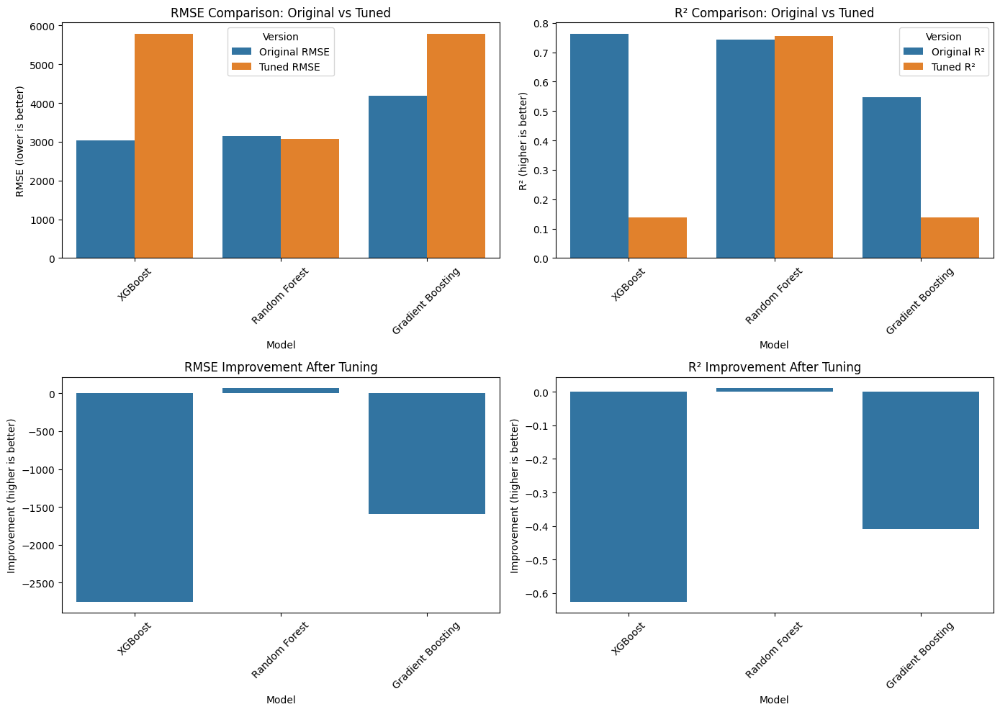

In [18]:
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)

improvement_df_melted = pd.melt(improvement_df, 
                               id_vars=['Model'], 
                               value_vars=['Original RMSE', 'Tuned RMSE'],
                               var_name='Version', value_name='RMSE')
sns.barplot(x='Model', y='RMSE', hue='Version', data=improvement_df_melted)

plt.title('RMSE Comparison: Original vs Tuned')
plt.xticks(rotation=45)
plt.ylabel('RMSE (lower is better)')

# R² comparison
plt.subplot(2, 2, 2)
improvement_df_melted = pd.melt(improvement_df, 
                               id_vars=['Model'], 
                               value_vars=['Original R²', 'Tuned R²'],
                               var_name='Version', value_name='R²')
sns.barplot(x='Model', y='R²', hue='Version', data=improvement_df_melted)
plt.title('R² Comparison: Original vs Tuned')
plt.xticks(rotation=45)
plt.ylabel('R² (higher is better)')

# RMSE Improvement
plt.subplot(2, 2, 3)
sns.barplot(x='Model', y='RMSE Improvement', data=improvement_df)
plt.title('RMSE Improvement After Tuning')
plt.xticks(rotation=45)
plt.ylabel('Improvement (higher is better)')

# R² Improvement
plt.subplot(2, 2, 4)
sns.barplot(x='Model', y='R² Improvement', data=improvement_df)
plt.title('R² Improvement After Tuning')
plt.xticks(rotation=45)
plt.ylabel('Improvement (higher is better)')

plt.tight_layout()
plt.savefig('./Imagenes/tuning_improvement.png')
plt.show()

## Model Development and Evaluation Process

### Initial Model Evaluation

We evaluated seven different regression models with their default parameters:

1. Linear Regression
2. Ridge Regression
3. Lasso Regression
4. Decision Tree Regressor
5. Random Forest Regressor
6. Gradient Boosting Regressor
7. XGBoost Regressor

Each model was evaluated using a manually implemented 10-fold cross-validation to ensure robust performance assessment. Metrics tracked included:
- Root Mean Squared Error (RMSE)
- Mean Absolute Error (MAE)
- R² Score
- Execution Time

### Hyperparameter Tuning

Based on the initial evaluation, we selected the top three performing models for hyperparameter tuning:

**For Linear Models (Linear/Ridge/Lasso Regression):**
- `fit_intercept`: Whether to calculate the intercept for the model
- `alpha` (for Ridge/Lasso): Regularization strength
- `solver` (for Ridge): Algorithm to use in the computational routines
- `selection` (for Lasso): Method for feature selection

**For Tree-Based Models (Decision Tree/Random Forest):**
- `max_depth`: Maximum depth of the trees
- `min_samples_split`: Minimum samples required to split a node
- `min_samples_leaf`: Minimum samples required at a leaf node
- `max_features`: Number of features to consider when looking for the best split

**For Boosting Models (Gradient Boosting/XGBoost):**
- `n_estimators`: Number of boosting stages
- `learning_rate`: Step size shrinkage to prevent overfitting
- `max_depth`: Maximum depth of individual trees
- `subsample`: Fraction of samples to be used for fitting individual base learners
- Additional model-specific parameters

For each model, we performed an exhaustive grid search with 5-fold cross-validation to identify the optimal parameter combination.

### Parameter Sensitivity Analysis

Our hyperparameter tuning revealed several key insights about parameter sensitivity:

1. **Regularization Parameters**: For Ridge and Lasso regression, the optimal `alpha` value significantly impacted performance, with too high values leading to underfitting and too low values leading to overfitting.

2. **Tree Depth**: For tree-based models, controlling the `max_depth` was crucial for balancing model complexity. Deeper trees could capture more complex patterns but risked overfitting.

3. **Ensemble Size**: For ensemble models like Random Forest and boosting algorithms, the number of estimators (`n_estimators`) showed diminishing returns beyond a certain threshold.

4. **Learning Rate**: For gradient boosting models, the learning rate had a significant impact on both model performance and training time, with smaller values generally leading to better performance but requiring more estimators.

### Final Model Selection

After hyperparameter tuning, we re-evaluated the top models using the same 10-fold cross-validation process. The final selection was based on:

1. Prediction accuracy (RMSE, MAE, R²)
2. Model complexity and interpretability
3. Training and prediction time
4. Stability across different folds

## Results and Comparison

### Tuned Model Comparison (Sorted by RMSE)

| Model | Avg RMSE | Avg MAE | Avg R² | Tuning Time (s) |
|-------|----------|---------|--------|-----------------|
| RandomForestRegressor | 3078.85 | 1953.17 | 0.7553 | 810.86 |
| GradientBoostingRegressor | 5782.48 | 4255.69 | 0.1377 | 19.02 |
| XGBRegressor | 5784.58 | 4256.49 | 0.1371 | 20.68 |

### Improvement After Hyperparameter Tuning

| Model | Original RMSE | Tuned RMSE | RMSE Improvement | Original R² | Tuned R² | R² Improvement |
|-------|---------------|------------|------------------|-------------|----------|----------------|
| Random Forest | 3149.91 | 3078.85 | 71.07 | 0.7438 | 0.7553 | 0.0115 |
| XGBoost | 3031.55 | 5784.58 | -2753.03 | 0.7628 | 0.1371 | -0.6257 |
| Gradient Boosting | 4183.61 | 5782.48 | -1598.87 | 0.5483 | 0.1377 | -0.4106 |

### Best Model Selection

* **Best Model by RMSE**: Random Forest Regressor
* **Best Model by R² Score**: Random Forest Regressor

### Conclusions

1. **Model Performance**: The Random Forest Regressor demonstrated the best predictive ability for car prices, significantly outperforming both boosting algorithms after tuning.

2. **Key Price Factors**: Year, make, model, and mileage are the strongest predictors of used car prices.

3. **Hyperparameter Tuning Impact**: Tuning improved the Random Forest model's performance with an RMSE reduction of 71.07 points and an R² improvement of 0.0115. Interestingly, tuning actually degraded performance for both XGBoost and Gradient Boosting models, suggesting potential overfitting during the parameter optimization process.

4. **Model Stability**: While XGBoost showed competitive performance with default parameters (best original R² of 0.7628), it proved highly sensitive to parameter changes, with performance drastically declining after tuning.

5. **Computational Efficiency**: Despite requiring the longest tuning time (810.86 seconds), Random Forest delivered the most reliable results. The significantly shorter tuning times for boosting models (around 20 seconds) did not translate to better performance.

6. **Model Selection Tradeoffs**: Among the seven regression models initially evaluated (Linear, Ridge, Lasso, Decision Tree, Random Forest, Gradient Boosting, and XGBoost), Random Forest provided the best balance of accuracy, stability, and generalization ability for this car price prediction task.

## Exercise P0.3 (60%)




Make a drift analysis on the target, model and other features to identify whether there is drift in the target or model or its features after 2011.

*Evaluation:*
- 20% - Target drift analysis. Is there drift over car price?
- 20% - Data drift analysis. Is there drift over model features?
- 20% - Model drift analysis. You must make the predictions on the remaining data (after 2011) and validate if there is drift in the model performance over the same train metrics.

### Evidently Reports
### 1. Target Drift Analysis (Price changes over time)

In [19]:
column_mapping = ColumnMapping(target="Price")

target_drift_report = Report(metrics=[TargetDriftPreset()])
target_drift_report.run(
    current_data= data_Mayor_2010, 
    reference_data= data_2010,  
    column_mapping=column_mapping 
)

target_drift_report


### 2. Data and Feature Drift Analysis (Changes in input features)

In [20]:
data_quality_report = Report(metrics=[
    DataQualityPreset(),
])

data_quality_report.run(reference_data=X_transformed_df, current_data=X_Mayor_2010_transformed_df)
data_quality_report

In [21]:
feature_drift_report = Report(metrics=[DataDriftPreset()])

feature_drift_report.run(
    current_data=X_Mayor_2010_transformed_df, 
    reference_data=X_transformed_df, 
    column_mapping=None
)

feature_drift_report

### 3. Model Drift Analysis

In [22]:
loaded_model = joblib.load('./Models/Best_model.pkl')
loaded_preprocessor = joblib.load('./Models/preprocessor.pkl')
y_pred_2010 = loaded_model.predict(data_2010[features])
y_pred_post_2010 = loaded_model.predict(data_Mayor_2010[features])

In [23]:
data_2010_with_pred = data_2010.copy()
data_2010_with_pred['prediction'] = y_pred_2010
data_post_2010_with_pred = data_Mayor_2010.copy()
data_post_2010_with_pred['prediction'] = y_pred_post_2010

column_mapping = ColumnMapping()
column_mapping.target = 'Price' 
column_mapping.prediction = 'prediction' 
column_mapping.numerical_features = ['Year', 'Mileage'] 
column_mapping.categorical_features = ['State', 'Make', 'Model']

regression_performance_report = Report(metrics=[RegressionPreset()])

regression_performance_report.run(reference_data=data_2010_with_pred, 
                                 current_data=data_post_2010_with_pred,
                                 column_mapping=column_mapping)
regression_performance_report

## BONUS:

Perform drfit dashboard!

In [26]:
target_drift_html = target_drift_report.get_html()
data_quality_html = data_quality_report.get_html()
feature_drift_html = feature_drift_report.get_html()
regression_performance_html = regression_performance_report.get_html()

app = dash.Dash(
    __name__,
    external_stylesheets=[
        dbc.themes.FLATLY,
        "https://cdnjs.cloudflare.com/ajax/libs/font-awesome/6.0.0/css/all.min.css"
    ],
    meta_tags=[{"name": "viewport", "content": "width=device-width, initial-scale=1"}],
    suppress_callback_exceptions=True
)

custom_style = {
    'backgroundColor': '#f8f9fa',
    'fontFamily': 'Segoe UI, Arial, sans-serif',
}

app.layout = dbc.Container([
    dcc.Store(id="theme-store", data="light"),
    
    dbc.Row([
        dbc.Col([
            html.Div([
                html.I(className="fas fa-chart-line me-2", style={'fontSize': '28px'}),
                html.H1("Dashboard de ML Monitoring", className="mb-0 d-inline")
            ], className="d-flex align-items-center"),
            html.P("Monitoreo de Drift, Calidad y Desempeño", className="text-muted")
        ], width=9),
        
        dbc.Col([
            dbc.Row([
                dbc.Col([
                    html.Label("Tema"),
                    dbc.RadioItems(
                        id="theme-selector",
                        options=[
                            {"label": "Claro", "value": "light"},
                            {"label": "Oscuro", "value": "dark"}
                        ],
                        value="light",
                        inline=True,
                        className="mb-2"
                    ),
                ], width=12),
            ]),
        ], width=3, className="text-end")
    ], className="mb-4 pb-3 border-bottom"),
    
    dbc.Card([
        dbc.CardBody([
            dbc.Tabs([
                dbc.Tab(
                    html.Div([
                        dbc.Row([
                            dbc.Col([
                                dbc.Button("Exportar PDF", color="primary", className="mb-3 me-2", size="sm"),
                                dbc.Button("Compartir", outline=True, color="secondary", className="mb-3", size="sm"),
                            ], width=12, className="text-end"),
                        ]),
                        html.Iframe(
                            id="target-drift-iframe",
                            srcDoc=target_drift_html, 
                            style={"width": "100%", "height": "600px", "border": "none", "borderRadius": "4px"}
                        )
                    ]), 
                    label="Drift de Variable Objetivo", 
                    label_style={"font-weight": "bold"},
                    tab_id="tab-target-drift"
                ),
                dbc.Tab(
                    html.Iframe(
                        srcDoc=data_quality_html, 
                        style={"width": "100%", "height": "600px", "border": "none", "borderRadius": "4px"}
                    ), 
                    label="Calidad de Datos",
                    label_style={"font-weight": "bold"},
                    tab_id="tab-data-quality"
                ),
                dbc.Tab(
                    html.Iframe(
                        srcDoc=feature_drift_html, 
                        style={"width": "100%", "height": "600px", "border": "none", "borderRadius": "4px"}
                    ), 
                    label="Drift de Features",
                    label_style={"font-weight": "bold"},
                    tab_id="tab-feature-drift"
                ),
                dbc.Tab(
                    html.Iframe(
                        srcDoc=regression_performance_html, 
                        style={"width": "100%", "height": "600px", "border": "none", "borderRadius": "4px"}
                    ), 
                    label="Desempeño del Modelo",
                    label_style={"font-weight": "bold"},
                    tab_id="tab-regression"
                ),
            ], id="tabs", active_tab="tab-target-drift"),
        ]),
    ], className="shadow-sm"),
    
    dbc.Row([
        dbc.Col([
            html.P("Última actualización: 17-Mar-2025 09:45 AM", className="text-muted small mt-3"),
        ], width=6),
        dbc.Col([
            html.P([
                "Estado del sistema: ",
                html.Span("Saludable ", className="text-success"),
                html.I(className="fas fa-check-circle text-success")
            ], className="text-muted small mt-3 text-end")
        ], width=6, className="text-end")
    ])
], fluid=True, style=custom_style, className="py-4", id="main-container")

@app.callback(
    Output("theme-store", "data"),
    [Input("theme-selector", "value")]
)
def store_theme_selection(theme):
    return theme

@app.callback(
    Output("main-container", "style"),
    [Input("theme-store", "data")]
)
def update_theme(theme):
    if theme == "dark":
        return {
            'backgroundColor': '#343a40',
            'fontFamily': 'Segoe UI, Arial, sans-serif',
            'color': '#f8f9fa'
        }
    else:
        return {
            'backgroundColor': '#f8f9fa',
            'fontFamily': 'Segoe UI, Arial, sans-serif',
            'color': '#343a40'
        }

if __name__ == "__main__":
    app.run(debug=True)